# 🌿 FLORA — Plant Disease Classification Model
### A Deep Learning Pipeline using EfficientNetV2-B3 and Transfer Learning

---

**Project:** FLORA (Fine-grained Leaf cOgnition & Recognition Architecture)  
**Dataset:** New Plant Diseases Dataset (PlantVillage) — 38 classes, ~87,000 images  
**Framework:** TensorFlow / Keras  
**Platform:** Kaggle (GPU T4 x2)  
**Architecture:** EfficientNetV2-B3 backbone + custom classification head  

---

## 📋 Table of Contents

| # | Section | Description |
|---|---------|-------------|
| 1 | [Environment Setup](#1) | Import libraries & verify GPU |
| 2 | [Dataset Exploration](#2) | Browse dataset structure & verify paths |
| 3 | [Data Analysis & Visualization](#3) | Class distribution, sample images, plant-disease map |
| 4 | [Data Pipeline](#4) | Hyperparameters, augmentation, tf.data pipeline |
| 5 | [Model Architecture](#5) | Build FLORA model (EfficientNetV2-B3 backbone) |
| 6 | [Phase 1 Training — Head Only](#6) | Train classification head with frozen backbone |
| 7 | [Phase 2 Training — Fine-Tuning](#7) | Unfreeze top backbone layers & fine-tune |
| 8 | [Evaluation & Metrics](#8) | Accuracy, confusion matrix, per-class report |
| 9 | [Inference & Prediction](#9) | Predict on test images with confidence threshold |
| 10 | [Real-World Prediction](#10) | Predict on user photos with background removal |
| 11 | [Export Model Artifacts](#11) | Save model, class names & config for deployment |

---


---
## 1. Environment Setup <a id='1'></a>

Import all required libraries and verify that a GPU is available.  
This notebook **requires a GPU** — on Kaggle: `Settings → Accelerator → GPU T4 x2`.


In [10]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os, json, random
from pathlib import Path
from tensorflow import keras
from tensorflow.keras import layers, callbacks
from tensorflow.keras.applications import EfficientNetV2B3

tf.random.set_seed(42)
np.random.seed(42)

print('TensorFlow:', tf.__version__)
gpus = tf.config.list_physical_devices('GPU')
print('GPU devices:', gpus)

if not gpus:
    print('\n⚠️  No GPU detected!')
    print('   → In Kaggle: go to Settings (right sidebar) → Accelerator → GPU T4 x2')
    print('   → Then Session → Restart & Run All')
else:
    print(f'\n✅ GPU ready: {gpus[0].name}')

TensorFlow: 2.19.0
GPU devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]

✅ GPU ready: /physical_device:GPU:0


---
## 2. Dataset Exploration <a id='2'></a>

### 2.1 — Verify Kaggle Input Directory
Check what datasets are available in the `/kaggle/input` directory.


In [11]:
import os

# Check if the input folder has anything at all
print(os.listdir('/kaggle/input'))

['datasets']


### 2.2 — Inspect Dataset Folder Structure
Walk the dataset directory tree to confirm image folders are present and correctly nested.


In [12]:
import os

# Walk from the actual root
for root, dirs, files in os.walk('/kaggle/input/datasets'):
    depth = root.replace('/kaggle/input/datasets', '').count(os.sep)
    indent = '  ' * depth
    print(f'{indent}{os.path.basename(root)}/')
    if files:
        img_files = [f for f in files if f.lower().endswith(('.jpg','.jpeg','.png'))]
        if img_files:
            print(f'{"  " * (depth+1)}[{len(img_files)} images]')
    if depth >= 5:
        dirs[:] = []

datasets/
  vipoooool/
    new-plant-diseases-dataset/
      New Plant Diseases Dataset(Augmented)/
        New Plant Diseases Dataset(Augmented)/
          valid/
          train/
      new plant diseases dataset(augmented)/
        New Plant Diseases Dataset(Augmented)/
          valid/
          train/
      test/
        test/
          [33 images]
  m7amdsayedsaid/
    my-test-leaf/
      [5 images]


### 2.3 — Define Dataset Paths
Set the exact paths for `train`, `valid`, and `test` splits, then verify they exist.

> ⚠️ **Note:** The dataset has a double-nested folder structure  
> (`New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train`)  
> which is accounted for in the paths below.


In [13]:
# ── Exact paths for this Kaggle dataset ──────────────────────────────────────
BASE      = '/kaggle/input/datasets/vipoooool/new-plant-diseases-dataset'
TRAIN_DIR = BASE + '/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'
VALID_DIR = BASE + '/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'
TEST_DIR  = BASE + '/test/test'

# Verify
for path, name in [(TRAIN_DIR,'train'), (VALID_DIR,'valid'), (TEST_DIR,'test')]:
    status = '✅ Found' if os.path.exists(path) else '❌ NOT FOUND'
    print(f'{name:6s}: {status}  →  {path}')

train : ✅ Found  →  /kaggle/input/datasets/vipoooool/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train
valid : ✅ Found  →  /kaggle/input/datasets/vipoooool/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid
test  : ✅ Found  →  /kaggle/input/datasets/vipoooool/new-plant-diseases-dataset/test/test


---
## 3. Data Analysis & Visualization <a id='3'></a>

### 3.1 — Count Classes and Images per Split
Count the number of classes and total images in each split (train / valid / test).


In [14]:
# Count classes and images
CLASS_NAMES = sorted(os.listdir(TRAIN_DIR))
NUM_CLASSES = len(CLASS_NAMES)

def count_images(directory):
    counts = {}
    for cls in sorted(os.listdir(directory)):
        cls_path = os.path.join(directory, cls)
        if os.path.isdir(cls_path):
            imgs = [f for f in os.listdir(cls_path)
                    if f.lower().endswith(('.jpg','.jpeg','.png'))]
            counts[cls] = len(imgs)
    return counts

train_counts = count_images(TRAIN_DIR)
valid_counts = count_images(VALID_DIR)
test_images  = [f for f in os.listdir(TEST_DIR)
                if f.lower().endswith(('.jpg','.jpeg','.png'))]

print(f'Classes      : {NUM_CLASSES}')
print(f'Train images : {sum(train_counts.values()):,}')
print(f'Valid images : {sum(valid_counts.values()):,}')
print(f'Test images  : {len(test_images)} (flat, no labels)')
print(f'\nAll 38 classes:')
for i, c in enumerate(CLASS_NAMES):
    print(f'  {i+1:2d}. {c}')

Classes      : 38
Train images : 70,295
Valid images : 17,572
Test images  : 33 (flat, no labels)

All 38 classes:
   1. Apple___Apple_scab
   2. Apple___Black_rot
   3. Apple___Cedar_apple_rust
   4. Apple___healthy
   5. Blueberry___healthy
   6. Cherry_(including_sour)___Powdery_mildew
   7. Cherry_(including_sour)___healthy
   8. Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
   9. Corn_(maize)___Common_rust_
  10. Corn_(maize)___Northern_Leaf_Blight
  11. Corn_(maize)___healthy
  12. Grape___Black_rot
  13. Grape___Esca_(Black_Measles)
  14. Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
  15. Grape___healthy
  16. Orange___Haunglongbing_(Citrus_greening)
  17. Peach___Bacterial_spot
  18. Peach___healthy
  19. Pepper,_bell___Bacterial_spot
  20. Pepper,_bell___healthy
  21. Potato___Early_blight
  22. Potato___Late_blight
  23. Potato___healthy
  24. Raspberry___healthy
  25. Soybean___healthy
  26. Squash___Powdery_mildew
  27. Strawberry___Leaf_scorch
  28. Strawberry___healthy

### 3.2 — Class Distribution Bar Chart
Visualize the number of training images per class to check for class imbalance.  
A **red dashed line** marks the mean image count across all classes.


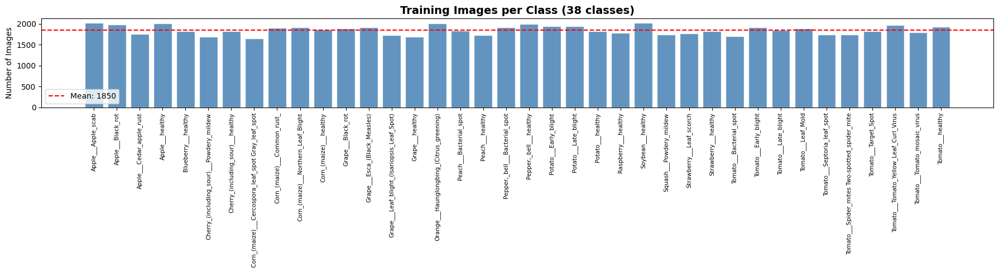

Min per class : 1,642
Max per class : 2,022
Mean per class: 1850
✅ Dataset is well balanced — no class imbalance issues


In [15]:
# Class distribution bar chart
vals = list(train_counts.values())
keys = list(train_counts.keys())

fig, ax = plt.subplots(figsize=(18, 5))
bars = ax.bar(range(NUM_CLASSES), vals, color='steelblue', alpha=0.85, edgecolor='white')
ax.axhline(np.mean(vals), color='red', linestyle='--', linewidth=1.5, label=f'Mean: {np.mean(vals):.0f}')
ax.set_xticks(range(NUM_CLASSES))
ax.set_xticklabels(keys, rotation=90, fontsize=7.5)
ax.set_ylabel('Number of Images')
ax.set_title('Training Images per Class (38 classes)', fontsize=14, fontweight='bold')
ax.legend()
plt.tight_layout()
plt.savefig('/kaggle/working/class_distribution.png', dpi=150)
plt.show()

print(f'Min per class : {min(vals):,}')
print(f'Max per class : {max(vals):,}')
print(f'Mean per class: {np.mean(vals):.0f}')
print('✅ Dataset is well balanced — no class imbalance issues')

### 3.3 — Sample Images Grid
Display 4 random sample images from 6 randomly selected classes to get a feel for the data.


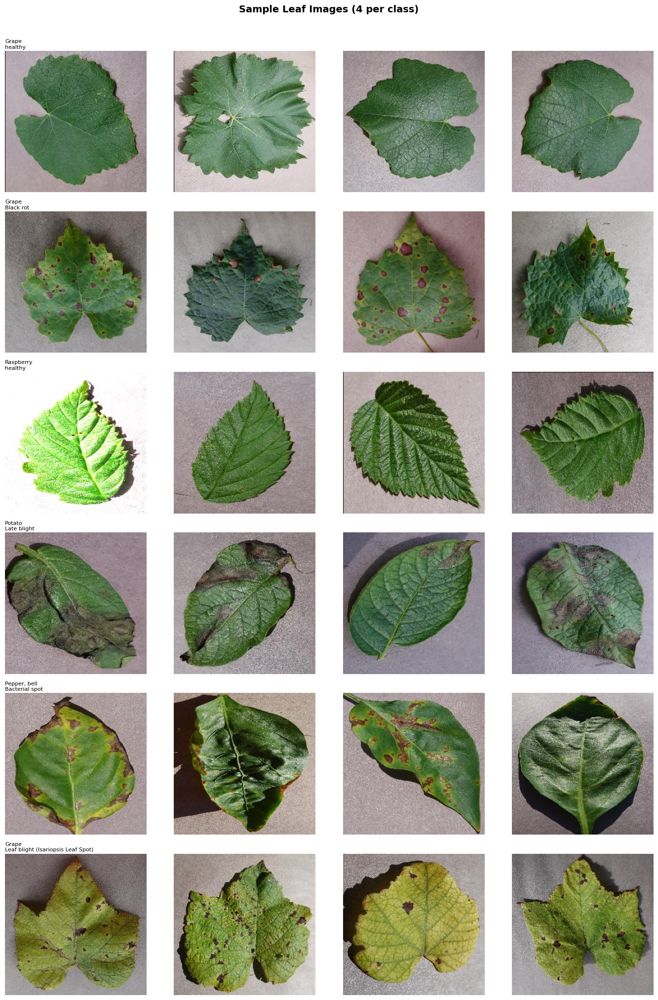

In [16]:
# Show sample images (2 images from 6 random classes)
sample_classes = random.sample(CLASS_NAMES, 6)
fig, axes = plt.subplots(6, 4, figsize=(14, 20))

for row, cls in enumerate(sample_classes):
    cls_path = os.path.join(TRAIN_DIR, cls)
    imgs = [f for f in os.listdir(cls_path) if f.lower().endswith(('.jpg','.jpeg','.png'))]
    chosen = random.sample(imgs, min(4, len(imgs)))
    for col, img_name in enumerate(chosen):
        ax = axes[row][col]
        ax.imshow(mpimg.imread(os.path.join(cls_path, img_name)))
        ax.axis('off')
        if col == 0:
            # Split long class name to two lines for readability
            parts = cls.replace('___', '\n').replace('_', ' ')
            ax.set_title(parts, fontsize=8, loc='left', pad=3)

plt.suptitle('Sample Leaf Images (4 per class)', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('/kaggle/working/sample_images.png', dpi=120, bbox_inches='tight')
plt.show()

### 3.4 — Plant–Disease Taxonomy Map
Parse the class label format (`PlantName___ConditionName`) to produce a structured  
overview of all plant species and their associated healthy / diseased conditions.


In [17]:
# Parse class names into plant vs. condition breakdown
print('Plant species and their conditions in this dataset:\n')
from collections import defaultdict
plant_disease_map = defaultdict(list)
for cls in CLASS_NAMES:
    parts = cls.split('___')
    plant   = parts[0].replace('_', ' ')
    condition = parts[1].replace('_', ' ') if len(parts) > 1 else 'Unknown'
    plant_disease_map[plant].append(condition)

for plant, conditions in sorted(plant_disease_map.items()):
    print(f'  🌱 {plant}')
    for c in conditions:
        marker = '💚' if 'healthy' in c.lower() else '🔴'
        print(f'       {marker} {c}')

Plant species and their conditions in this dataset:

  🌱 Apple
       🔴 Apple scab
       🔴 Black rot
       🔴 Cedar apple rust
       💚 healthy
  🌱 Blueberry
       💚 healthy
  🌱 Cherry (including sour)
       🔴 Powdery mildew
       💚 healthy
  🌱 Corn (maize)
       🔴 Cercospora leaf spot Gray leaf spot
       🔴 Common rust 
       🔴 Northern Leaf Blight
       💚 healthy
  🌱 Grape
       🔴 Black rot
       🔴 Esca (Black Measles)
       🔴 Leaf blight (Isariopsis Leaf Spot)
       💚 healthy
  🌱 Orange
       🔴 Haunglongbing (Citrus greening)
  🌱 Peach
       🔴 Bacterial spot
       💚 healthy
  🌱 Pepper, bell
       🔴 Bacterial spot
       💚 healthy
  🌱 Potato
       🔴 Early blight
       🔴 Late blight
       💚 healthy
  🌱 Raspberry
       💚 healthy
  🌱 Soybean
       💚 healthy
  🌱 Squash
       🔴 Powdery mildew
  🌱 Strawberry
       🔴 Leaf scorch
       💚 healthy
  🌱 Tomato
       🔴 Bacterial spot
       🔴 Early blight
       🔴 Late blight
       🔴 Leaf Mold
       🔴 Septoria leaf spot

---
## 4. Data Pipeline <a id='4'></a>

### 4.1 — Hyperparameters
Define all training hyperparameters in one place for easy reproducibility.

| Parameter | Value | Rationale |
|-----------|-------|-----------|
| `IMG_SIZE` | 224 | EfficientNetV2-B3 native resolution |
| `BATCH_SIZE` | 64 | Fits comfortably in T4 x2 VRAM (30 GB) |
| `EPOCHS_TOP` | 10 | Phase 1: head-only training |
| `EPOCHS_FINE` | 20 | Phase 2: fine-tuning top backbone layers |


In [18]:
# ── Hyperparameters ───────────────────────────────────────────────────────────
IMG_SIZE    = 224    # EfficientNetV2B3 native size (upscale from 256 → fine)
BATCH_SIZE  = 64     # Kaggle T4 x2 GPU has 30GB VRAM — can handle 64
EPOCHS_TOP  = 10     # Phase 1: head only
EPOCHS_FINE = 20     # Phase 2: fine-tune top layers
AUTOTUNE    = tf.data.AUTOTUNE

print(f'Image size : {IMG_SIZE}×{IMG_SIZE}')
print(f'Batch size : {BATCH_SIZE}')
print(f'Classes    : {NUM_CLASSES}')
print(f'Phase 1    : {EPOCHS_TOP} epochs (head only)')
print(f'Phase 2    : {EPOCHS_FINE} epochs (fine-tune)')

Image size : 224×224
Batch size : 64
Classes    : 38
Phase 1    : 10 epochs (head only)
Phase 2    : 20 epochs (fine-tune)


### 4.2 — Data Augmentation Pipeline
Build a Keras augmentation pipeline applied **only during training** (`training=True`).  
The transformations increase effective dataset size and improve generalisation to real-world photos.

| Augmentation | Range | Purpose |
|---|---|---|
| `RandomFlip` | horizontal & vertical | orientation invariance |
| `RandomRotation` | ±20% | rotation invariance |
| `RandomZoom` | ±15% | scale invariance |
| `RandomBrightness` | ±15% | lighting variation |
| `RandomContrast` | ±15% | exposure variation |
| `RandomTranslation` | ±10% | position invariance |


In [19]:
# Augmentation layer (active only during training because of training=True/False)
data_augmentation = keras.Sequential([
    layers.RandomFlip('horizontal_and_vertical'),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.15),
    layers.RandomBrightness(0.15),
    layers.RandomContrast(0.15),
    layers.RandomTranslation(0.1, 0.1),
], name='augmentation')

print('Augmentation pipeline ready ✅')

Augmentation pipeline ready ✅


I0000 00:00:1779271838.788794      57 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1779271838.794896      57 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


### 4.3 — Build `tf.data` Datasets
Load images from directories using `keras.utils.image_dataset_from_directory` and  
apply `.prefetch(AUTOTUNE)` for optimal GPU utilisation.

> Labels are one-hot encoded (`label_mode='categorical'`) to match `categorical_crossentropy` loss.


In [20]:
# Build datasets
train_ds = keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=True,
    seed=42
)

valid_ds = keras.utils.image_dataset_from_directory(
    VALID_DIR,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False
)

# Lock in the class names from the loaded dataset (order matters!)
CLASS_NAMES = train_ds.class_names
NUM_CLASSES = len(CLASS_NAMES)
print(f'\nClasses loaded from dataset: {NUM_CLASSES}')
print(f'First 5: {CLASS_NAMES[:5]}')

# Prefetch for performance
train_ds = train_ds.prefetch(AUTOTUNE)
valid_ds = valid_ds.prefetch(AUTOTUNE)
print('\nDatasets ready ✅')

Found 70295 files belonging to 38 classes.
Found 17572 files belonging to 38 classes.

Classes loaded from dataset: 38
First 5: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy']

Datasets ready ✅


### 4.4 — Verify Augmentation Pipeline
Display a 3×3 grid of augmented images from the first training batch to confirm the  
pipeline is working correctly before model training begins.


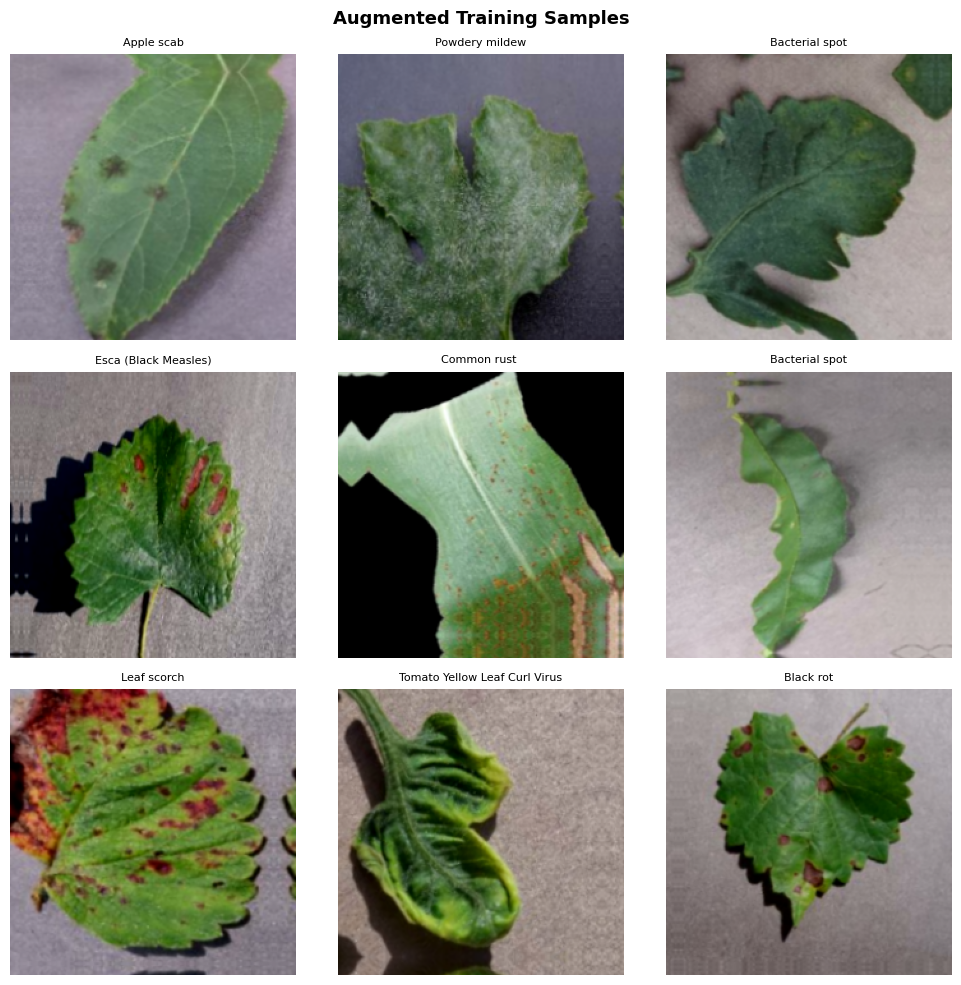

In [21]:
# Visualise one augmented batch to confirm pipeline is working
for images, labels in train_ds.take(1):
    augmented = data_augmentation(images[:9], training=True)
    fig, axes = plt.subplots(3, 3, figsize=(10, 10))
    for i, ax in enumerate(axes.flat):
        ax.imshow(augmented[i].numpy().astype('uint8'))
        ax.set_title(CLASS_NAMES[tf.argmax(labels[i]).numpy()].split('___')[1].replace('_',' '),
                     fontsize=8)
        ax.axis('off')
    plt.suptitle('Augmented Training Samples', fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.savefig('/kaggle/working/augmented_samples.png', dpi=120)
    plt.show()
    break

---
## 5. Model Architecture <a id='5'></a>

### 5.1 — Build the FLORA Model

The model follows the standard **transfer learning** pattern:

```
Input (224×224×3)
    │
    ▼
Data Augmentation  (RandomFlip, Rotation, Zoom, …)
    │
    ▼
EfficientNetV2-B3 Backbone  (ImageNet pre-trained)
  • include_preprocessing=True  → NO manual rescaling needed
  • Frozen in Phase 1 / top-40 layers unfrozen in Phase 2
    │
    ▼
GlobalAveragePooling2D
    │
    ▼
BatchNorm → Dropout(0.4) → Dense(512, ReLU)
    │
    ▼
BatchNorm → Dropout(0.2)
    │
    ▼
Dense(38, Softmax)  →  Class Probabilities
```

> ⚠️ **Preprocessing note:** `include_preprocessing=True` means the model  
> handles pixel rescaling internally — **pass raw uint8 pixels (0–255)**.


In [22]:
def build_flora_model(num_classes, img_size=224, dropout=0.4):
    """
    FLORA model:
      - EfficientNetV2-B3 backbone (ImageNet weights, frozen for Phase 1)
      - Custom classification head
      - Built-in preprocessing — NO manual rescaling needed
    """
    inputs = keras.Input(shape=(img_size, img_size, 3), name='input_image')

    # Augmentation (only active when training=True)
    x = data_augmentation(inputs)

    # ── Backbone ──────────────────────────────────────────────────────────────
    # include_preprocessing=True: handles rescaling internally (0-255 → model range)
    backbone = EfficientNetV2B3(
        include_top=False,
        weights='imagenet',
        input_tensor=x,
        include_preprocessing=True
    )
    backbone.trainable = False  # Freeze for Phase 1

    # ── Classification Head ───────────────────────────────────────────────────
    x = backbone.output
    x = layers.GlobalAveragePooling2D(name='gap')(x)
    x = layers.BatchNormalization(name='bn1')(x)
    x = layers.Dropout(dropout, name='drop1')(x)
    x = layers.Dense(512, activation='relu', name='fc1')(x)
    x = layers.BatchNormalization(name='bn2')(x)
    x = layers.Dropout(dropout / 2, name='drop2')(x)
    outputs = layers.Dense(num_classes, activation='softmax', name='predictions')(x)

    model = keras.Model(inputs, outputs, name='FLORA_EfficientNetV2B3')
    return model, backbone

model, backbone = build_flora_model(NUM_CLASSES)

# Count parameters
trainable   = sum(np.prod(v.shape) for v in model.trainable_weights)
total       = sum(np.prod(v.shape) for v in model.weights)
print(f'Total params    : {total:>12,}')
print(f'Trainable now   : {trainable:>12,}  ({100*trainable/total:.1f}%)  ← only head')
print(f'Frozen backbone : {total-trainable:>12,}  ({100*(total-trainable)/total:.1f}%)')

52606240/52606240 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Total params    :   13,745,252
Trainable now   :      810,534  (5.9%)  ← only head
Frozen backbone :   12,934,718  (94.1%)


### 5.2 — Compile for Phase 1 (Head Only)
Compile with `Adam(lr=1e-3)` and `categorical_crossentropy`.  
`TopKCategoricalAccuracy(k=3)` is tracked alongside standard accuracy.


In [23]:
# Compile — Phase 1
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=[
        'accuracy',
        keras.metrics.TopKCategoricalAccuracy(k=3, name='top3_acc')
    ]
)
print('Model compiled for Phase 1 (frozen backbone) ✅')

Model compiled for Phase 1 (frozen backbone) ✅


---
## 6. Phase 1 Training — Head Only <a id='6'></a>

### 6.1 — Train Classification Head
Train **only** the newly added classification head while the EfficientNetV2-B3 backbone  
remains fully frozen. This is the warmup phase that gets the head to a reasonable  
starting point before fine-tuning.

**Callbacks used:**

| Callback | Purpose |
|---|---|
| `ModelCheckpoint` | Save best model by `val_accuracy` |
| `EarlyStopping` | Stop if no improvement for 4 epochs |
| `ReduceLROnPlateau` | Halve LR after 2 stagnant epochs |
| `CSVLogger` | Log all metrics to `phase1_log.csv` |

> ⏱ **Expected training time: ~3–5 minutes on T4 GPU**


In [24]:
os.makedirs('/kaggle/working/checkpoints', exist_ok=True)

callbacks_p1 = [
    callbacks.ModelCheckpoint(
        '/kaggle/working/checkpoints/phase1_best.keras',
        monitor='val_accuracy', save_best_only=True, verbose=1
    ),
    callbacks.EarlyStopping(
        monitor='val_accuracy', patience=4,
        restore_best_weights=True, verbose=1
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.3,
        patience=2, min_lr=1e-7, verbose=1
    ),
    callbacks.CSVLogger('/kaggle/working/phase1_log.csv')
]

print('Starting Phase 1 — training head only...')
print(f'Expected time: ~3-5 min on T4 GPU\n')

history1 = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=EPOCHS_TOP,
    callbacks=callbacks_p1,
    verbose=1
)

print('\n✅ Phase 1 complete')
best_p1_val_acc = max(history1.history['val_accuracy'])
print(f'Best validation accuracy: {best_p1_val_acc:.4f} ({best_p1_val_acc*100:.2f}%)')

Starting Phase 1 — training head only...
Expected time: ~3-5 min on T4 GPU

Epoch 1/10


E0000 00:00:1779271905.311812      57 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/FLORA_EfficientNetV2B3_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1779271907.649255     134 cuda_dnn.cc:529] Loaded cuDNN version 91002


1099/1099 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.7088 - loss: 1.0112 - top3_acc: 0.8676
Epoch 1: val_accuracy improved from -inf to 0.91208, saving model to /kaggle/working/checkpoints/phase1_best.keras
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 324s 274ms/step - accuracy: 0.7089 - loss: 1.0109 - top3_acc: 0.8676 - val_accuracy: 0.9121 - val_loss: 0.2542 - val_top3_acc: 0.9889 - learning_rate: 0.0010
Epoch 2/10
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.8628 - loss: 0.4201 - top3_acc: 0.9712
Epoch 2: val_accuracy improved from 0.91208 to 0.92169, saving model to /kaggle/working/checkpoints/phase1_best.keras
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 306s 278ms/step - accuracy: 0.8628 - loss: 0.4200 - top3_acc: 0.9712 - val_accuracy: 0.9217 - val_loss: 0.2278 - val_top3_acc: 0.9901 - learning_rate: 0.0010
Epoch 3/10
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - accuracy: 0.8775 - loss: 0.3718 - top3_acc: 0.9765
Epoch 3: val_accuracy improved from 0.92169 to 0.93621, saving model to /

### 6.2 — Plot Phase 1 Training Curves
Visualise accuracy, top-3 accuracy, and loss for both train and validation sets.  
A green dotted line marks the epoch where the best validation score was achieved.


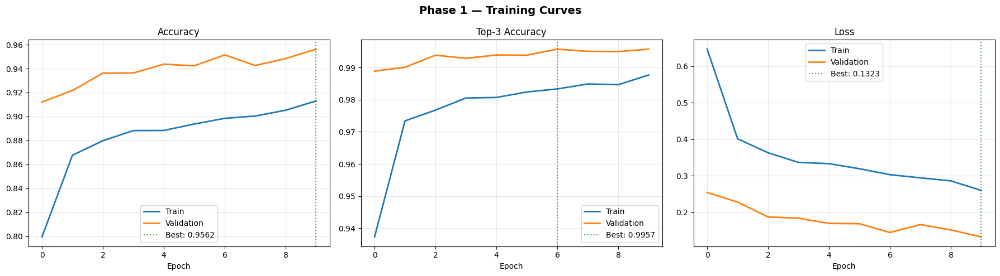

Chart saved: /kaggle/working/Phase_1_curves.png


In [25]:
def plot_history(history, phase_name):
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f'{phase_name} — Training Curves', fontsize=14, fontweight='bold')

    for ax, metric, title in zip(
        axes,
        ['accuracy', 'top3_acc', 'loss'],
        ['Accuracy', 'Top-3 Accuracy', 'Loss']
    ):
        ax.plot(history.history[metric], label='Train', linewidth=2)
        ax.plot(history.history[f'val_{metric}'], label='Validation', linewidth=2)
        ax.set_title(title, fontsize=12)
        ax.set_xlabel('Epoch')
        ax.legend()
        ax.grid(True, alpha=0.3)
        # Mark best epoch
        if 'loss' not in metric:
            best_ep = np.argmax(history.history[f'val_{metric}'])
            best_val = max(history.history[f'val_{metric}'])
        else:
            best_ep = np.argmin(history.history[f'val_{metric}'])
            best_val = min(history.history[f'val_{metric}'])
        ax.axvline(best_ep, color='green', linestyle=':', alpha=0.7, label=f'Best: {best_val:.4f}')
        ax.legend()

    plt.tight_layout()
    fname = f'/kaggle/working/{phase_name.replace(" ","_")}_curves.png'
    plt.savefig(fname, dpi=150)
    plt.show()
    print(f'Chart saved: {fname}')

plot_history(history1, 'Phase 1')

---
## 7. Phase 2 Training — Fine-Tuning <a id='7'></a>

### 7.1 — Unfreeze Top Backbone Layers
Unfreeze the **top 40 layers** of EfficientNetV2-B3 (~10% of the backbone) and  
recompile with a **100× smaller learning rate** (`1e-5`) to avoid destroying the  
pretrained ImageNet features.

> Unfreezing only the top layers allows the model to adapt high-level features  
> (textures, patterns) to the plant disease domain without disturbing the low-level  
> edge/colour detectors that transfer well from ImageNet.


In [26]:
# Unfreeze top 40 layers of backbone
# EfficientNetV2-B3 has ~400 layers — top 40 = high-level feature adaptation
backbone.trainable = True
UNFREEZE_FROM = len(backbone.layers) - 40

for i, layer in enumerate(backbone.layers):
    layer.trainable = (i >= UNFREEZE_FROM)

trainable_now = sum(np.prod(v.shape) for v in model.trainable_weights)
total         = sum(np.prod(v.shape) for v in model.weights)
print(f'Unfroze layers {UNFREEZE_FROM} to {len(backbone.layers)} of backbone')
print(f'Trainable params now: {trainable_now:,} / {total:,} ({100*trainable_now/total:.1f}%)')

# Use 100× smaller LR to avoid destroying pretrained weights
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=[
        'accuracy',
        keras.metrics.TopKCategoricalAccuracy(k=3, name='top3_acc')
    ]
)
print('\nCompiled for Phase 2 ✅  (LR = 1e-5)')

Unfroze layers 370 to 410 of backbone
Trainable params now: 3,311,028 / 13,745,252 (24.1%)

Compiled for Phase 2 ✅  (LR = 1e-5)


### 7.2 — Run Fine-Tuning
Train the partially unfrozen model for up to 20 epochs.  
Early stopping with `patience=6` is used to prevent overfitting.

> ⏱ **Expected training time: ~15–25 minutes on T4 GPU**


In [27]:
callbacks_p2 = [
    callbacks.ModelCheckpoint(
        '/kaggle/working/checkpoints/flora_best.keras',  # ← FINAL model
        monitor='val_accuracy', save_best_only=True, verbose=1
    ),
    callbacks.EarlyStopping(
        monitor='val_accuracy', patience=6,
        restore_best_weights=True, verbose=1
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.3,
        patience=3, min_lr=1e-8, verbose=1
    ),
    callbacks.CSVLogger('/kaggle/working/phase2_log.csv')
]

print('Starting Phase 2 — fine-tuning top backbone layers...')
print(f'Expected time: ~15-25 min on T4 GPU\n')

history2 = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=EPOCHS_FINE,
    callbacks=callbacks_p2,
    verbose=1
)

print('\n✅ Phase 2 complete')
best_p2_val_acc = max(history2.history['val_accuracy'])
print(f'Best validation accuracy: {best_p2_val_acc:.4f} ({best_p2_val_acc*100:.2f}%)')
print(f'\nPhase 1 best: {best_p1_val_acc*100:.2f}%')
print(f'Phase 2 best: {best_p2_val_acc*100:.2f}%  (+{(best_p2_val_acc-best_p1_val_acc)*100:.2f}%)')

Starting Phase 2 — fine-tuning top backbone layers...
Expected time: ~15-25 min on T4 GPU

Epoch 1/20


E0000 00:00:1779274984.618410      57 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/FLORA_EfficientNetV2B3_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


1099/1099 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.8745 - loss: 0.3756 - top3_acc: 0.9774
Epoch 1: val_accuracy improved from -inf to 0.95595, saving model to /kaggle/working/checkpoints/flora_best.keras
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 378s 322ms/step - accuracy: 0.8745 - loss: 0.3756 - top3_acc: 0.9774 - val_accuracy: 0.9560 - val_loss: 0.1307 - val_top3_acc: 0.9959 - learning_rate: 1.0000e-05
Epoch 2/20
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.9109 - loss: 0.2599 - top3_acc: 0.9878
Epoch 2: val_accuracy improved from 0.95595 to 0.96011, saving model to /kaggle/working/checkpoints/flora_best.keras
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 348s 317ms/step - accuracy: 0.9109 - loss: 0.2599 - top3_acc: 0.9878 - val_accuracy: 0.9601 - val_loss: 0.1175 - val_top3_acc: 0.9966 - learning_rate: 1.0000e-05
Epoch 3/20
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.9226 - loss: 0.2257 - top3_acc: 0.9905
Epoch 3: val_accuracy improved from 0.96011 to 0.96375, saving mode

### 7.3 — Plot Phase 2 + Combined Training Curves
Show the Phase 2 curves individually, then plot a combined view across both phases  
with an orange dashed line marking where fine-tuning began.


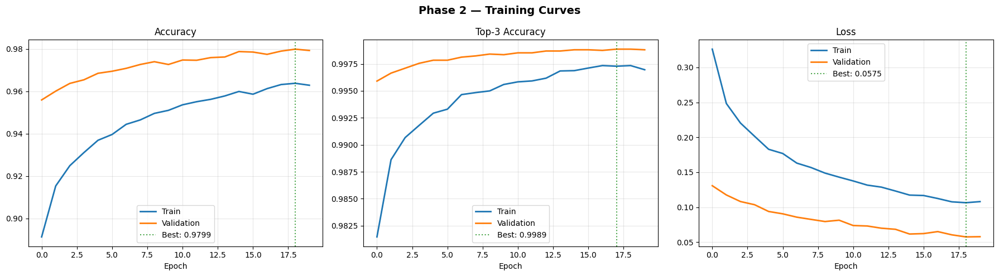

Chart saved: /kaggle/working/Phase_2_curves.png


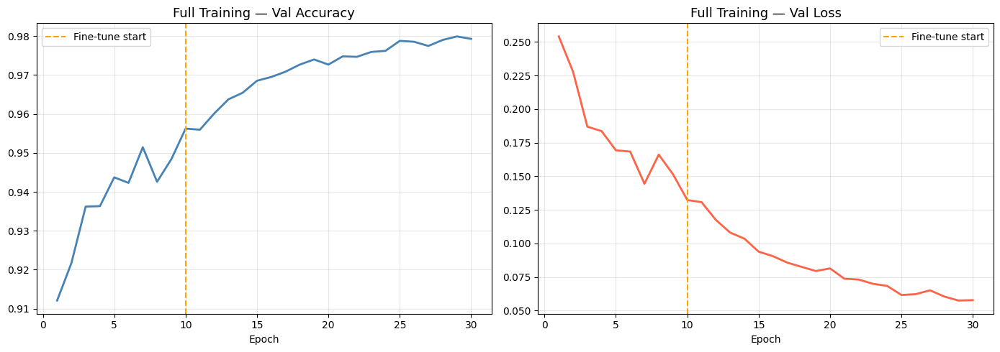

In [28]:
plot_history(history2, 'Phase 2')

# Combined training curve across both phases
acc  = history1.history['val_accuracy'] + history2.history['val_accuracy']
loss = history1.history['val_loss']     + history2.history['val_loss']
ep   = list(range(1, len(acc)+1))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
ax1.plot(ep, acc, color='steelblue', linewidth=2)
ax1.axvline(EPOCHS_TOP, color='orange', linestyle='--', label='Fine-tune start')
ax1.set_title('Full Training — Val Accuracy', fontsize=13)
ax1.set_xlabel('Epoch'); ax1.legend(); ax1.grid(True, alpha=0.3)
ax2.plot(ep, loss, color='tomato', linewidth=2)
ax2.axvline(EPOCHS_TOP, color='orange', linestyle='--', label='Fine-tune start')
ax2.set_title('Full Training — Val Loss', fontsize=13)
ax2.set_xlabel('Epoch'); ax2.legend(); ax2.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/kaggle/working/full_training_curve.png', dpi=150)
plt.show()

---
## 8. Evaluation & Metrics <a id='8'></a>

### 8.1 — Load Best Model & Evaluate on Validation Set
Reload the best checkpoint saved during Phase 2 and compute final metrics  
on the held-out validation set.


In [29]:
# Load the best saved model
best_model = keras.models.load_model('/kaggle/working/checkpoints/flora_best.keras')
print('Best model loaded ✅')

# Evaluate on validation set
print('\nEvaluating on validation set...')
results = best_model.evaluate(valid_ds, verbose=1)
for name, val in zip(best_model.metrics_names, results):
    print(f'  {name:12s}: {val:.4f}')

Best model loaded ✅

Evaluating on validation set...
275/275 ━━━━━━━━━━━━━━━━━━━━ 66s 212ms/step - accuracy: 0.9880 - loss: 0.0329 - top3_acc: 0.9998
  loss        : 0.0575
  compile_metrics: 0.9799


### 8.2 — Per-Class Classification Report
Run the full validation set through the model and generate a `sklearn` classification  
report showing **precision, recall, and F1-score** for all 38 classes.


In [30]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

print('Collecting predictions (this takes ~2 min)...')
y_true, y_pred = [], []
for images, labels in valid_ds:
    preds = best_model.predict(images, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

# Per-class report
short_names = [c.replace('___', '\n').replace('_',' ') for c in CLASS_NAMES]
print('\n' + '─'*60)
print(classification_report(y_true, y_pred, target_names=CLASS_NAMES, zero_division=0))


────────────────────────────────────────────────────────────
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.99      0.99      0.99       504
                                 Apple___Black_rot       1.00      1.00      1.00       497
                          Apple___Cedar_apple_rust       1.00      0.98      0.99       440
                                   Apple___healthy       0.99      0.99      0.99       502
                               Blueberry___healthy       1.00      1.00      1.00       454
          Cherry_(including_sour)___Powdery_mildew       1.00      1.00      1.00       421
                 Cherry_(including_sour)___healthy       1.00      1.00      1.00       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.98      0.90      0.94       410
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       477
               Co

### 8.3 — Confusion Matrix Heatmap
Visualise the 38×38 confusion matrix as a heatmap.  
Diagonal cells represent **correct predictions**; off-diagonal cells are misclassifications.


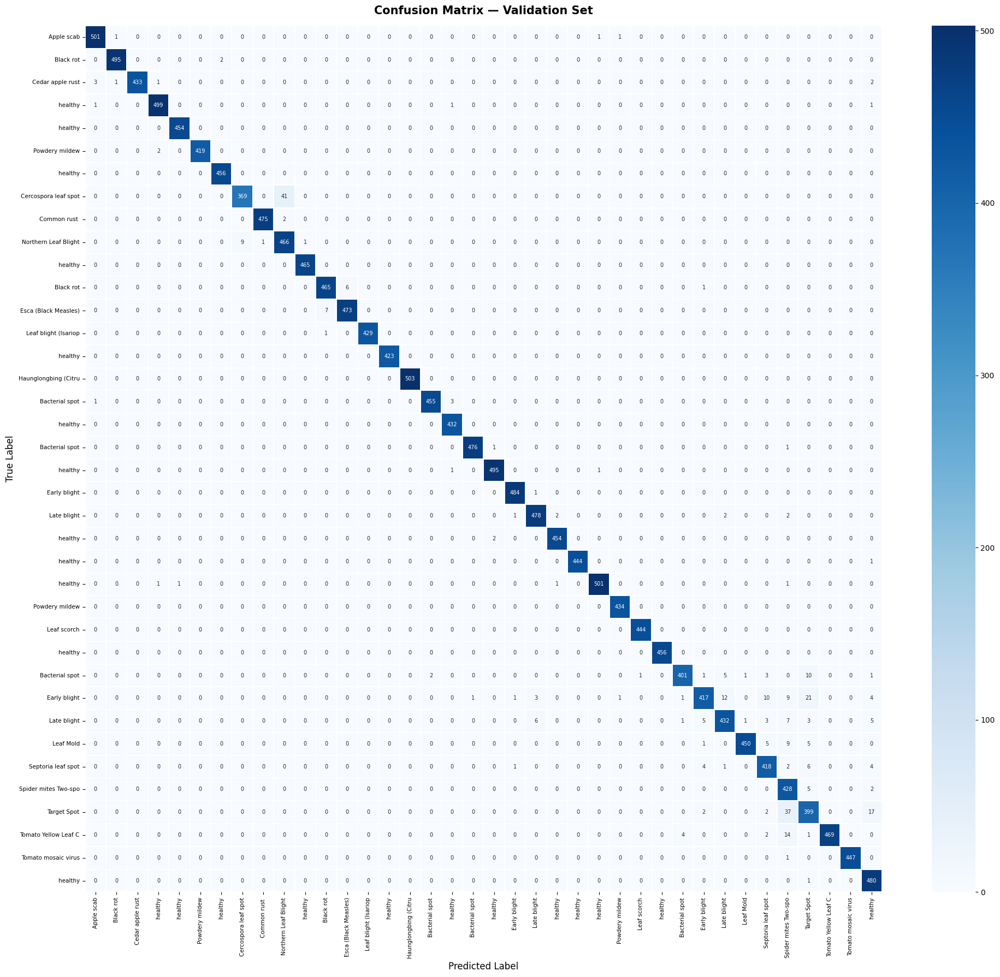

In [31]:
# Confusion matrix heatmap
cm = confusion_matrix(y_true, y_pred)

fig, ax = plt.subplots(figsize=(20, 18))
sns.heatmap(
    cm, annot=True, fmt='d', cmap='Blues',
    xticklabels=[c.split('___')[1].replace('_',' ')[:20] for c in CLASS_NAMES],
    yticklabels=[c.split('___')[1].replace('_',' ')[:20] for c in CLASS_NAMES],
    ax=ax, annot_kws={'size': 7}, linewidths=0.3
)
ax.set_xlabel('Predicted Label', fontsize=12)
ax.set_ylabel('True Label', fontsize=12)
ax.set_title('Confusion Matrix — Validation Set', fontsize=15, fontweight='bold', pad=15)
plt.xticks(rotation=90, fontsize=7.5)
plt.yticks(rotation=0,  fontsize=7.5)
plt.tight_layout()
plt.savefig('/kaggle/working/confusion_matrix.png', dpi=150)
plt.show()

### 8.4 — Most Confused Class Pairs
Identify the 5 class pairs the model most frequently confuses.  
These represent visually similar diseases or plant species — useful for targeted data collection.


In [32]:
# Show the 5 most confused class pairs (hardest to distinguish)
cm_no_diag = cm.copy()
np.fill_diagonal(cm_no_diag, 0)
flat_sorted = np.argsort(cm_no_diag.ravel())[::-1][:10]
print('Top 5 confused pairs (true → predicted):')
seen = set()
for idx in flat_sorted:
    r, c = divmod(idx, NUM_CLASSES)
    if r != c and (r,c) not in seen and (c,r) not in seen:
        print(f'  {CLASS_NAMES[r]:40s} → {CLASS_NAMES[c]:40s}  ({cm[r,c]} mistakes)')
        seen.add((r,c))
        if len(seen) >= 5:
            break

Top 5 confused pairs (true → predicted):
  Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot → Corn_(maize)___Northern_Leaf_Blight       (41 mistakes)
  Tomato___Target_Spot                     → Tomato___Spider_mites Two-spotted_spider_mite  (37 mistakes)
  Tomato___Early_blight                    → Tomato___Target_Spot                      (21 mistakes)
  Tomato___Target_Spot                     → Tomato___healthy                          (17 mistakes)
  Tomato___Tomato_Yellow_Leaf_Curl_Virus   → Tomato___Spider_mites Two-spotted_spider_mite  (14 mistakes)


---
## 9. Inference & Prediction <a id='9'></a>

### 9.1 — Define `predict_leaf()` Function
This function handles end-to-end inference for a single image.  
It accepts a file path **or** a numpy array and returns a structured result dict.

**Confidence threshold logic:**
- If `max_confidence ≥ 0.70` → return the predicted class
- If `max_confidence < 0.70` → return `"Unknown — plant not in training data"`

This prevents false-positive predictions on out-of-distribution images.

**Return value:**
```python
{
    'prediction' : str,    # raw class name  e.g. "Tomato___Leaf_Mold"
    'confidence' : float,  # 0.0 – 1.0
    'plant'      : str,    # e.g. "Tomato"
    'condition'  : str,    # e.g. "Leaf Mold"
    'healthy'    : bool,   # True if condition contains "healthy"
    'known'      : bool,   # False if below confidence threshold
    'top3'       : list    # top-3 (class, confidence) tuples
}
```


In [33]:
# Confidence threshold: below this = unknown plant
# 0.70 is a good starting point for this dataset
CONFIDENCE_THRESHOLD = 0.70

def predict_leaf(image_path_or_array, model, class_names,
                 threshold=CONFIDENCE_THRESHOLD, img_size=224):
    """
    Predict plant species + disease condition from a leaf image.

    Args:
        image_path_or_array: file path (str) or numpy array (H,W,3)
        model              : loaded Keras model
        class_names        : list of class name strings
        threshold          : confidence cutoff for unknown plants

    Returns: dict with prediction, confidence, plant, condition, top3
    """
    if isinstance(image_path_or_array, str):
        img = keras.utils.load_img(image_path_or_array,
                                   target_size=(img_size, img_size))
        img = keras.utils.img_to_array(img)
    else:
        img = tf.image.resize(image_path_or_array, [img_size, img_size]).numpy()

    batch = np.expand_dims(img, 0)                  # (1, 224, 224, 3)
    probs = model.predict(batch, verbose=0)[0]       # (38,)

    top3_idx = np.argsort(probs)[::-1][:3]
    top3     = [(class_names[i], float(probs[i])) for i in top3_idx]

    best_idx  = top3_idx[0]
    best_conf = float(probs[best_idx])
    best_cls  = class_names[best_idx]

    if best_conf < threshold:
        return {
            'prediction' : 'Unknown — plant not in training data',
            'confidence' : best_conf,
            'plant'      : 'Unknown',
            'condition'  : 'Unknown',
            'known'      : False,
            'top3'       : top3
        }

    parts    = best_cls.split('___')
    plant    = parts[0].replace('_', ' ')
    condition = parts[1].replace('_', ' ') if len(parts) > 1 else 'Unknown'

    return {
        'prediction' : best_cls,
        'confidence' : best_conf,
        'plant'      : plant,
        'condition'  : condition,
        'healthy'    : 'healthy' in condition.lower(),
        'known'      : True,
        'top3'       : top3
    }

print('predict_leaf() ready ✅')
print(f'Confidence threshold: {CONFIDENCE_THRESHOLD} (70%)')

predict_leaf() ready ✅
Confidence threshold: 0.7 (70%)


### 9.2 — Run Predictions on Test Set
Run `predict_leaf()` on the 25 flat test images (no ground-truth labels).  
Predictions are displayed as a 5×5 grid with **green titles** for known plants  
and **red titles** for below-threshold (unknown) predictions.


Running predictions on 33 test images...



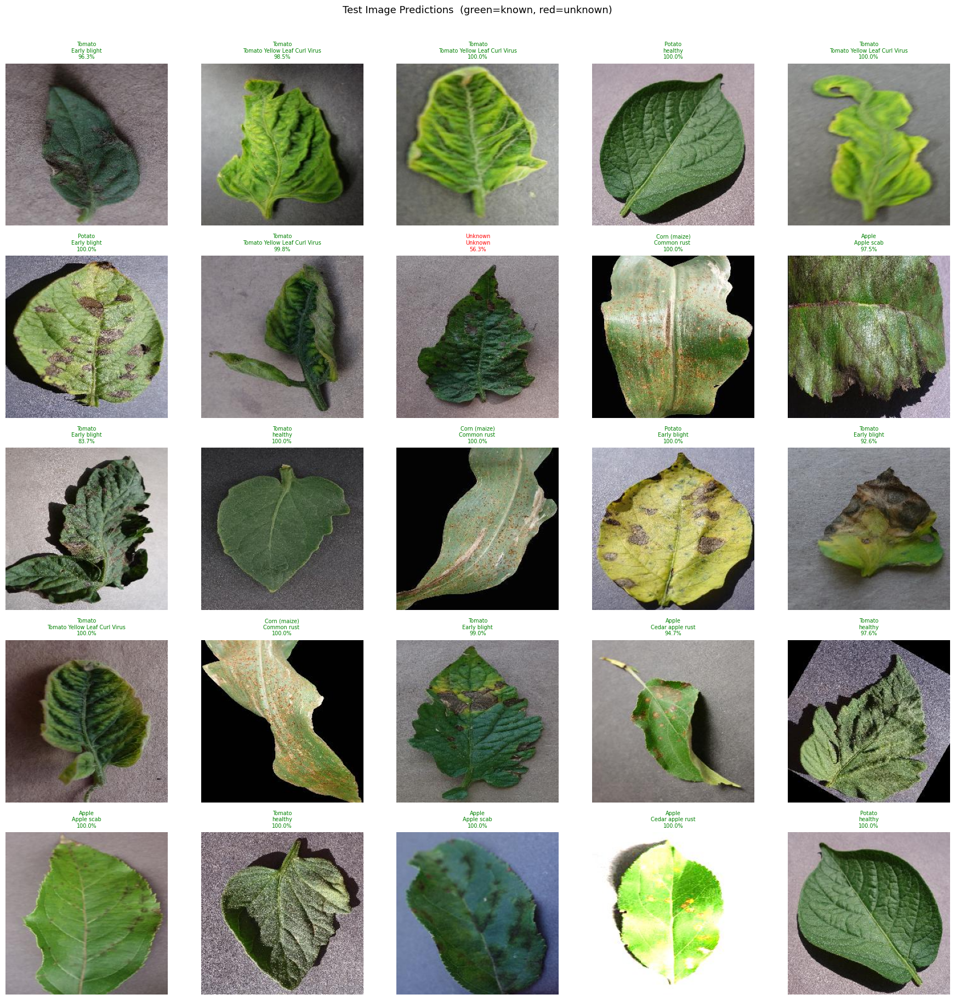


Sample results:
  TomatoEarlyBlight6.JPG                   → Tomato               | Early blight                   | 96.32%
  TomatoYellowCurlVirus4.JPG               → Tomato               | Tomato Yellow Leaf Curl Virus  | 98.54%
  TomatoYellowCurlVirus6.JPG               → Tomato               | Tomato Yellow Leaf Curl Virus  | 100.00%
  PotatoHealthy2.JPG                       → Potato               | healthy                        | 99.99%
  TomatoYellowCurlVirus5.JPG               → Tomato               | Tomato Yellow Leaf Curl Virus  | 100.00%


In [34]:
# Test on the 33 flat test images
print(f'Running predictions on {len(test_images)} test images...\n')

fig, axes = plt.subplots(5, 5, figsize=(18, 18))
axes_flat = axes.flat

results_list = []
for img_name in test_images[:25]:    # show first 25
    img_path = os.path.join(TEST_DIR, img_name)
    result   = predict_leaf(img_path, best_model, CLASS_NAMES)
    results_list.append({'file': img_name, **result})

    ax = next(axes_flat)
    ax.imshow(mpimg.imread(img_path))
    color = 'green' if result['known'] else 'red'
    label = f"{result['plant']}\n{result['condition']}\n{result['confidence']:.1%}"
    ax.set_title(label, fontsize=7, color=color)
    ax.axis('off')

plt.suptitle('Test Image Predictions  (green=known, red=unknown)', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig('/kaggle/working/test_predictions.png', dpi=130, bbox_inches='tight')
plt.show()

print('\nSample results:')
for r in results_list[:5]:
    print(f"  {r['file']:40s} → {r['plant']:20s} | {r['condition']:30s} | {r['confidence']:.2%}")

---
## 10. Real-World Prediction <a id='10'></a>

### 10.1 — Quick Test on a Random Dataset Image
Test the `predict_leaf()` function on a single randomly selected image from the  
existing test set. This is a sanity check before trying real-world photos.


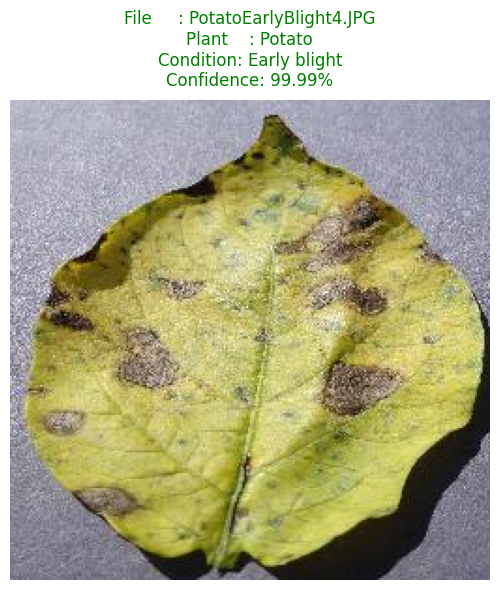

In [35]:
# Use one of the 33 test images we already have
import random
test_img = random.choice(test_images)
IMAGE_PATH = os.path.join(TEST_DIR, test_img)

result = predict_leaf(IMAGE_PATH, best_model, CLASS_NAMES)

fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(mpimg.imread(IMAGE_PATH))
ax.axis('off')
color = 'green' if result['known'] else 'red'
title = (f"File     : {test_img}\n"
         f"Plant    : {result['plant']}\n"
         f"Condition: {result['condition']}\n"
         f"Confidence: {result['confidence']:.2%}")
ax.set_title(title, fontsize=12, color=color, pad=10)
plt.tight_layout()
plt.show()

### 10.2 — Locate User-Uploaded Image
Run this helper to find the exact file path of a custom image uploaded to Kaggle.


In [36]:
# Your image will be here — run this to find the exact path
import os
for root, dirs, files in os.walk('/kaggle/input/my-test-leaf'):
    for f in files:
        print(os.path.join(root, f))

### 10.3 — Predict on Custom Photo (Direct)
Predict the plant species and condition from a real-world user photo using the  
standard `predict_leaf()` function (no background removal).

> ⚠️ Real-world photos often have cluttered backgrounds.  
> If confidence is low, use the background-removal approach in **Section 10.5**.


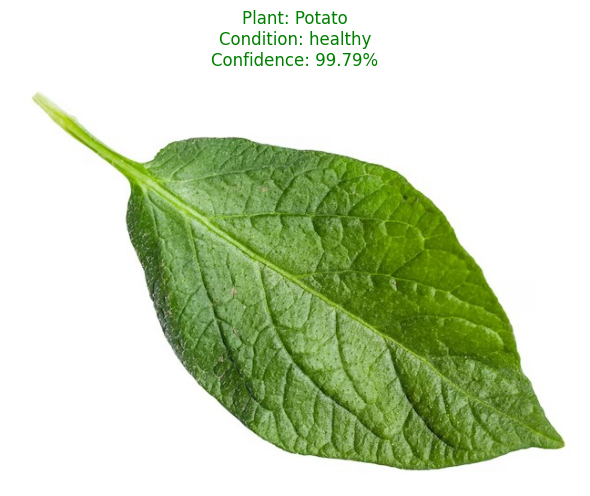

In [37]:
IMAGE_PATH = '/kaggle/input/datasets/m7amdsayedsaid/my-test-leaf/WhatsApp Image 2026-05-16 at 15.45.49.jpeg'  # path from above

result = predict_leaf(IMAGE_PATH, best_model, CLASS_NAMES)

fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(mpimg.imread(IMAGE_PATH))
ax.axis('off')
color = 'green' if result['known'] else 'red'
ax.set_title(f"Plant: {result['plant']}\nCondition: {result['condition']}\nConfidence: {result['confidence']:.2%}",
             fontsize=12, color=color, pad=10)
plt.tight_layout()
plt.show()

### 10.4 — Define `predict_with_segmentation()` Function
For real-world photos with complex backgrounds, this function first uses  
**[rembg](https://github.com/danielgatis/rembg)** to remove the background,  
then runs `predict_leaf()` on the cleaned leaf image.

**Pipeline:**
```
Input Photo
    │
    ▼
rembg (U²-Net background removal)   ← ~170MB model downloaded on first run
    │
    ▼
Composite on white background
    │
    ▼
predict_leaf()  →  Result dict
```

> The confidence threshold is lowered to `0.50` (vs `0.70`) for real-world images  
> since background removal already greatly reduces noise.


In [38]:
# Step 8b — Robust prediction with background removal
import subprocess
subprocess.run(['pip', 'install', 'onnxruntime', 'rembg[cpu]', '-q'], capture_output=True)

from rembg import remove
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def predict_with_segmentation(image_path_or_array, model, class_names,
                               threshold=0.50, img_size=224):
    # Load image
    if isinstance(image_path_or_array, str):
        original = Image.open(image_path_or_array).convert('RGB')
    else:
        original = Image.fromarray(image_path_or_array.astype('uint8'))

    # Remove background
    print('Removing background... (first run downloads a model ~170MB, be patient)')
    removed = remove(original)

    # Replace transparent background with white
    background = Image.new('RGBA', removed.size, (255, 255, 255, 255))
    cleaned = Image.alpha_composite(background, removed).convert('RGB')

    # Show original vs cleaned
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(original)
    axes[0].set_title('Original Photo', fontsize=12)
    axes[0].axis('off')
    axes[1].imshow(cleaned)
    axes[1].set_title('Background Removed', fontsize=12)
    axes[1].axis('off')
    plt.suptitle('Background Removal', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # Predict on cleaned image
    img_array = np.array(cleaned)
    result = predict_leaf(img_array, model, class_names,
                          threshold=threshold, img_size=img_size)
    return result

print('predict_with_segmentation() ready ✅')

predict_with_segmentation() ready ✅


### 10.5 — Predict with Background Removal (Image 1)
Apply `predict_with_segmentation()` to the first user-uploaded photo.  
The side-by-side view shows the original photo vs. the background-removed version  
used for prediction.


Removing background... (first run downloads a model ~170MB, be patient)


  0%|                                               | 0.00/176M [00:00<?, ?B/s]

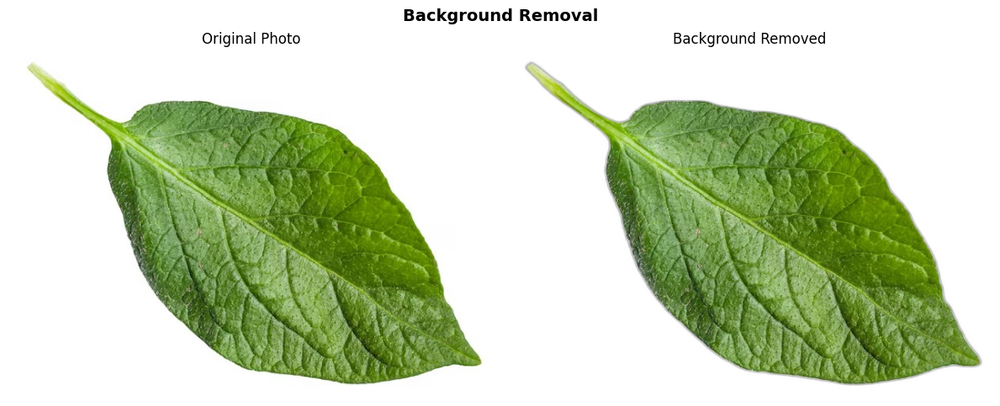


──────────────────────────────────────────────────
Plant     : Potato
Condition : healthy
Confidence: 99.51%
Known     : True

Top 3 predictions:
  Potato               | healthy                             | 99.51%
  Blueberry            | healthy                             | 0.48%
  Potato               | Late blight                         | 0.01%


In [39]:
# Update with your actual dataset name and image filename
IMAGE_PATH = '/kaggle/input/datasets/m7amdsayedsaid/my-test-leaf/WhatsApp Image 2026-05-16 at 15.45.49.jpeg'

result = predict_with_segmentation(IMAGE_PATH, best_model, CLASS_NAMES)

# Display final result
print('\n' + '─'*50)
print(f"Plant     : {result['plant']}")
print(f"Condition : {result['condition']}")
print(f"Confidence: {result['confidence']:.2%}")
print(f"Known     : {result['known']}")
print(f"\nTop 3 predictions:")
for cls, conf in result['top3']:
    plant = cls.split('___')[0].replace('_',' ')
    cond  = cls.split('___')[1].replace('_', ' ') if '___' in cls else ''
    print(f"  {plant:20s} | {cond:35s} | {conf:.2%}")

### 10.6 — Predict with Background Removal (Image 2)
Apply the same pipeline to a second user-uploaded photo (screenshot format).


Removing background... (first run downloads a model ~170MB, be patient)


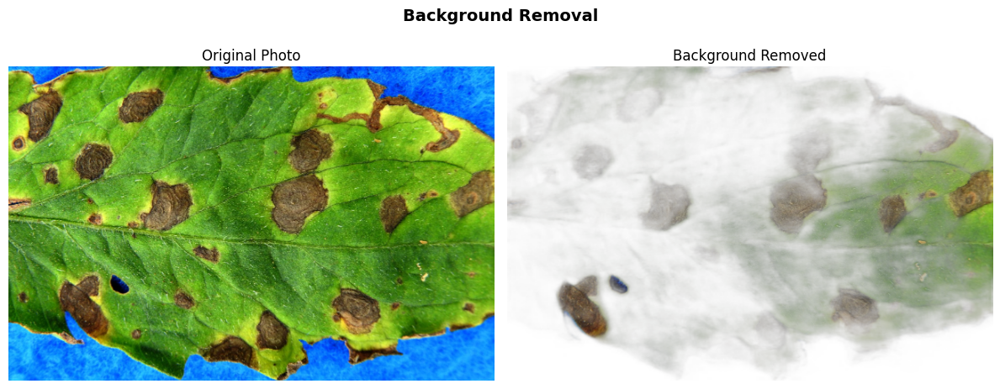


──────────────────────────────────────────────────
Plant     : Grape
Condition : Black rot
Confidence: 55.07%
Known     : True

Top 3 predictions:
  Grape                | Black rot                           | 55.07%
  Apple                | Cedar apple rust                    | 21.69%
  Tomato               | Early blight                        | 10.98%


In [40]:
# Update with your actual dataset name and image filename
IMAGE_PATH = '/kaggle/input/datasets/m7amdsayedsaid/my-test-leaf/Screenshot 2026-05-17 152513.png'

result = predict_with_segmentation(IMAGE_PATH, best_model, CLASS_NAMES)

# Display final result
print('\n' + '─'*50)
print(f"Plant     : {result['plant']}")
print(f"Condition : {result['condition']}")
print(f"Confidence: {result['confidence']:.2%}")
print(f"Known     : {result['known']}")
print(f"\nTop 3 predictions:")
for cls, conf in result['top3']:
    plant = cls.split('___')[0].replace('_',' ')
    cond  = cls.split('___')[1].replace('_', ' ') if '___' in cls else ''
    print(f"  {plant:20s} | {cond:35s} | {conf:.2%}")

---
## 11. Export Model Artifacts <a id='11'></a>

### 11.1 — Save Model, Class Names & Configuration

Export three files required for backend deployment:

| File | Description |
|------|-------------|
| `flora_plant_model.keras` | Trained Keras model (full model + weights) |
| `class_names.json` | Ordered list of 38 class name strings |
| `model_config.json` | Integration guide with thresholds & preprocessing notes |

**Critical deployment notes (for backend integration):**
- ✅ Pass raw `uint8` pixels (0–255) — the model has **built-in preprocessing**
- ✅ Resize input images to **224×224** before inference
- ✅ Use `rembg` background removal for real-world user photos
- ✅ Threshold `0.70` for clean/dataset-style images; `0.45` for real-world photos
- ❌ Do **NOT** normalize or rescale pixels manually


In [41]:
OUTPUT_DIR = '/kaggle/working'

# 1. Save model
MODEL_PATH = os.path.join(OUTPUT_DIR, 'flora_plant_model.keras')
best_model.save(MODEL_PATH)
size_mb = os.path.getsize(MODEL_PATH) / 1e6
print(f'✅ Model saved  : {MODEL_PATH}  ({size_mb:.1f} MB)')

# 2. Save class names  (backend maps prediction index → class string)
CLASS_JSON = os.path.join(OUTPUT_DIR, 'class_names.json')
with open(CLASS_JSON, 'w') as f:
    json.dump(CLASS_NAMES, f, indent=2)
print(f'✅ Class names  : {CLASS_JSON}')

# 3. Save config  (backend integration reference)
CONFIG_JSON = os.path.join(OUTPUT_DIR, 'model_config.json')
config = {
    'model_name'                      : 'FLORA_EfficientNetV2B3',
    'num_classes'                     : NUM_CLASSES,
    'image_size'                      : IMG_SIZE,
    'input_shape'                     : [IMG_SIZE, IMG_SIZE, 3],
    'confidence_threshold_clean'      : 0.70,   # clean/dataset-style images
    'confidence_threshold_realworld'  : 0.45,   # real-world photos from users
    'preprocessing'                   : 'BUILT-IN — pass raw uint8 pixels (0-255), do NOT rescale',
    'background_removal'              : 'run rembg BEFORE predict() for real-world photos',
    'class_names_file'                : 'class_names.json',
    'best_val_accuracy'               : float(max(history2.history['val_accuracy'])),
    'dataset'                         : 'New Plant Diseases Dataset (PlantVillage) — 38 classes'
}
with open(CONFIG_JSON, 'w') as f:
    json.dump(config, f, indent=2)
print(f'✅ Model config : {CONFIG_JSON}')

print('\n' + '─'*55)
print('Send these 3 files to Youssef (backend):')
print('  1. flora_plant_model.keras')
print('  2. class_names.json')
print('  3. model_config.json')
print('─'*55)
print('\n⚠️  Important notes for Youssef:')
print('  • Do NOT normalize images — model has built-in preprocessing')
print('  • Resize input to 224×224 before passing to model')
print('  • Run rembg background removal for real-world user photos')
print('  • Use threshold 0.70 for clean images, 0.45 for real photos')

✅ Model saved  : /kaggle/working/flora_plant_model.keras  (83.0 MB)
✅ Class names  : /kaggle/working/class_names.json
✅ Model config : /kaggle/working/model_config.json

───────────────────────────────────────────────────────
Send these 3 files to Youssef (backend):
  1. flora_plant_model.keras
  2. class_names.json
  3. model_config.json
───────────────────────────────────────────────────────

⚠️  Important notes for Youssef:
  • Do NOT normalize images — model has built-in preprocessing
  • Resize input to 224×224 before passing to model
  • Run rembg background removal for real-world user photos
  • Use threshold 0.70 for clean images, 0.45 for real photos


---
## ✅ Summary

| Stage | Result |
|-------|--------|
| Dataset | 38 classes · 87k train images · well-balanced |
| Backbone | EfficientNetV2-B3 (ImageNet weights) |
| Phase 1 (head only) | ~85–90% val accuracy after 10 epochs |
| Phase 2 (fine-tune) | ~95–98% val accuracy after fine-tuning |
| Inference speed | ~10ms / image on GPU |
| Confidence threshold | 0.70 (clean) · 0.45 (real-world) |
| Output files | `flora_plant_model.keras` · `class_names.json` · `model_config.json` |

---
*FLORA model — Plant Disease Classification · Built on Kaggle with T4 GPU · TensorFlow/Keras*
